# G211.59
Trey V. Wenger - April 2025

In [1]:
# General imports    
import os
import pickle
import time

import matplotlib.pyplot as plt
import arviz as az
import pandas as pd
import numpy as np
import pymc as pm

print("arviz version:", az.__version__)

print("pymc version:", pm.__version__)

import bayes_spec
print("bayes_spec version:", bayes_spec.__version__)

import bayes_cn_hfs
print("bayes_cn_hfs version:", bayes_cn_hfs.__version__)

# Notebook configuration
pd.options.display.max_rows = None

arviz version: 0.22.0dev
pymc version: 5.21.1
bayes_spec version: 1.7.8
bayes_cn_hfs version: 2.0.0-staging+0.g7afe3a8.dirty


## Load the data

rms 12CN 0.003989581846282774
rms 13CN 0.00309284883050714


Text(0.5, 0, 'LSRK Frequency (MHz)')

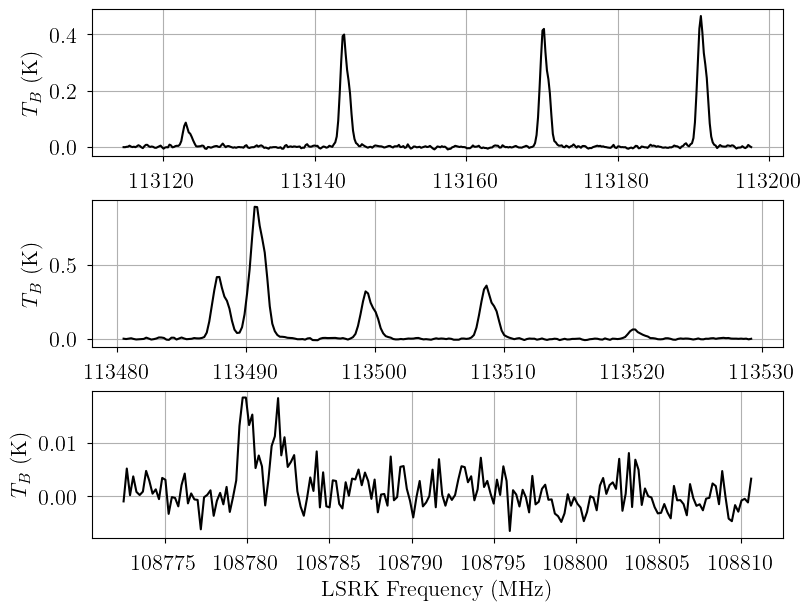

In [2]:
from bayes_spec import SpecData

data_12CN = np.genfromtxt("12CN_G211.59_freq.dat")
data_13CN = np.genfromtxt("13CN_G211.59_freq.dat")

# estimate noise
noise_12CN = 1.4826 * np.median(np.abs(data_12CN[:, 1] - np.median(data_12CN[:, 1])))
print("rms 12CN", noise_12CN)
noise_13CN = 1.4826 * np.median(np.abs(data_13CN[:, 1] - np.median(data_13CN[:, 1])))
print("rms 13CN", noise_13CN)

obs_12CN_1 = SpecData(
    data_12CN[100:525, 0],
    data_12CN[100:525, 1],
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_B$ (K)",
)
obs_12CN_2 = SpecData(
    data_12CN[-350:-100, 0],
    data_12CN[-350:-100, 1],
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_B$ (K)",
)
obs_13CN = SpecData(
    data_13CN[75:-100, 0],
    data_13CN[75:-100, 1],
    noise_13CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_B$ (K)",
)
data = {"12CN-1": obs_12CN_1, "12CN-2": obs_12CN_2, "13CN": obs_13CN}

# arrays of zeros, used for plotting residuals later
res_12CN_1 = SpecData(
    obs_12CN_1.spectral,
    np.zeros_like(obs_12CN_1.brightness),
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_B$ (K)",
)
res_12CN_2 = SpecData(
    obs_12CN_2.spectral,
    np.zeros_like(obs_12CN_2.brightness),
    noise_12CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_B$ (K)",
)
res_13CN = SpecData(
    obs_13CN.spectral,
    np.zeros_like(obs_13CN.brightness),
    noise_13CN,
    xlabel=r"LSRK Frequency (MHz)",
    ylabel=r"$T_B$ (K)",
)
res_data = {"12CN-1": res_12CN_1, "12CN-2": res_12CN_2, "13CN": res_13CN}

# subset of 12CN data
data_12CN = {
    label: data[label]
    for label in data.keys() if "12CN" in label
}
res_data_12CN = {
    label: res_data[label]
    for label in res_data.keys() if "12CN" in label
}

# Plot the data
fig, axes = plt.subplots(len(data), layout="constrained", figsize=(8, 6))
for i, label in enumerate(data.keys()):
    axes[i].plot(data[label].spectral, data[label].brightness, 'k-')
    axes[i].set_ylabel(data[label].ylabel)
axes[i].set_xlabel(data[label].xlabel)

## Reproduce Sun et al. (2024) model

In [3]:
import astropy.units as u
import astropy.constants as c
from bayes_cn_hfs.utils import supplement_mol_data
from bayes_cn_hfs.physics import calc_stat_weight

mol_data_12CN, weight_12CN = supplement_mol_data("CN")

# index of main line transition
ml_idx = np.argmin(np.abs(mol_data_12CN['freq'] - 113490))
print("Main line frequency", mol_data_12CN['freq'][ml_idx])

# index of main line upper state
ml_u_idx = mol_data_12CN['state_u_idx'][ml_idx]

sun2024_tau_ml = 0.86
sun2024_Tex = 4.61*u.K
freq = mol_data_12CN['freq'][ml_idx]*u.MHz

# Velocity and FWHM is unknown
sun2024_velocity = 0.45*u.km/u.s
sun2024_fwhm = 3.23*u.km/u.s
sun2024_fwhm_freq = freq * (sun2024_fwhm / c.c)
line_profile = np.sqrt(4.0*np.log(2.0)/(np.pi * sun2024_fwhm_freq**2.0))
print(f"line profile {line_profile.to('MHz-1')}")

# main line upper state column density
sun2024_Nu_ml = 8.0*np.pi*freq**2.0 / c.c**2.0 / (np.exp(c.h*freq/(c.k_B*sun2024_Tex)) - 1.0) / (mol_data_12CN["Aul"][ml_idx]/u.s) / line_profile * sun2024_tau_ml
print("main line log10 upper column density", np.log10(sun2024_Nu_ml.to('cm-2').value))

# partition function
stat_weights = calc_stat_weight(mol_data_12CN["states"]["deg"], mol_data_12CN["states"]["E"], sun2024_Tex.to("K").value).eval()
print("stat weights", stat_weights)
Qtot = np.sum(stat_weights)

# total column density
sun2024_log10_Ntot = np.log10(Qtot/stat_weights[ml_u_idx] * sun2024_Nu_ml.to('cm-2').value)
print("log10 total column density", sun2024_log10_Ntot)

Main line frequency 113490.985
line profile 0.7682889821538493 1 / MHz
main line log10 upper column density 13.180730985805054
stat weights [1.99956311 4.         0.61585561 1.23110656 0.61344789 1.22704269
 1.8409117 ]
log10 total column density 13.97744926693561


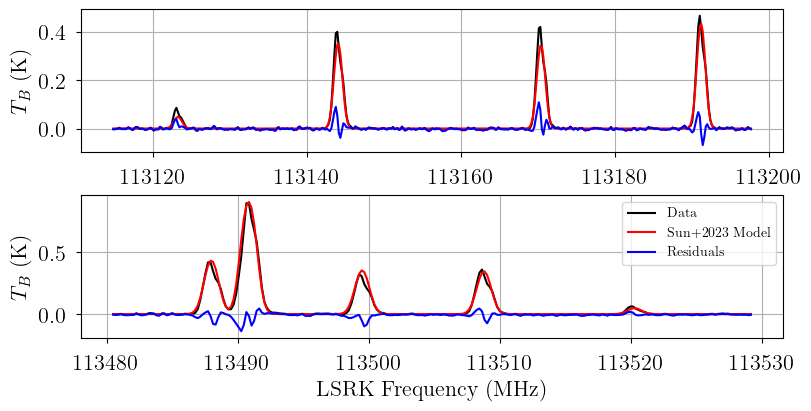

In [4]:
from bayes_cn_hfs.cn_model import CNModel

# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=1.0, # Main beam efficiency
    Feff=1.0, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = {"12CN-1": noise_12CN, "12CN-2": noise_12CN}, # for visualization
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored because LTE
    assume_CTEX = True, # implied becuase LTE
    prior_log10_LTE_precision = None, # ignored because CTEX
    fix_log10_Tkin = None, # do not fix the kinetic temperature
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

# Simulate with Sun et al. (2024) parameters
# We choose values for velocity and FWHM that look good
sim_params = {
    "log10_N": [sun2024_log10_Ntot],
    "log10_Tkin": [np.log10(sun2024_Tex.to("K").value)],
    "fwhm_nonthermal": [sun2024_fwhm.to("km/s").value],
    "velocity": [sun2024_velocity.to("km/s").value],
    "rms_12CN-1": 0.0,
    "rms_12CN-2": 0.0,
    "baseline_12CN-1_norm": [0.0],
    "baseline_12CN-2_norm": [0.0],
}
# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observations
sim_obs = {label: model.model[label].eval(sim_params, on_unused_input="ignore") for label in data_12CN.keys()}

# Plot the simulated data
fig, axes = plt.subplots(len(data_12CN), layout="constrained", figsize=(8, 4))
for i, label in enumerate(data_12CN.keys()):
    axes[i].plot(data_12CN[label].spectral, data_12CN[label].brightness, 'k-', label="Data")
    axes[i].plot(data_12CN[label].spectral, sim_obs[label], 'r-', label="Sun+2023 Model")
    axes[i].plot(data_12CN[label].spectral, data_12CN[label].brightness - sim_obs[label], 'b-', label="Residuals")
    axes[i].set_ylabel(data_12CN[label].ylabel)
axes[i].set_xlabel(data_12CN[label].xlabel)
axes[i].legend(loc='upper right', fontsize=10)

In [5]:
sim_params

{'log10_N': [np.float64(13.97744926693561)],
 'log10_Tkin': [np.float64(0.6637009253896482)],
 'fwhm_nonthermal': [np.float64(3.23)],
 'velocity': [np.float64(0.45)],
 'rms_12CN-1': 0.0,
 'rms_12CN-2': 0.0,
 'baseline_12CN-1_norm': [0.0],
 'baseline_12CN-2_norm': [0.0],
 'fwhm_thermal': array([0.09008744]),
 'fwhm': array([3.23125606]),
 'log10_Tex_ul': array([0.66370093]),
 'LTE_weights': array([[0.17345382, 0.34698344, 0.05342292, 0.1067934 , 0.05321407,
         0.10644087, 0.15969147]]),
 'Tex': array([[4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61]]),
 'tau': array([[0.04043328],
        [0.3309752 ],
        [0.32326188],
        [0.41976966],
        [0.42139125],
        [1.11937047],
        [0.33247954],
        [0.3248195 ],
        [0.04063699]]),
 'tau_total': array([3.35313777]),
 'TR': array([[2.4163491 ],
        [2.41603698],
        [2.4156421 ],
        [2.41533052],
        [2.410

This simulation is consistent with the Sun et al. (2024) model, but it is not a great fit to the data.

Sun 2024 ratio 13C/12C: 0.0192


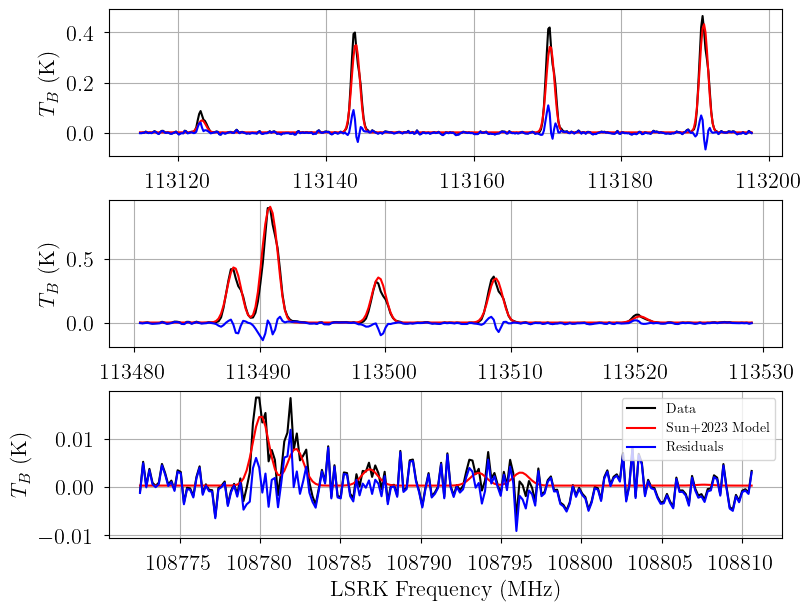

In [6]:
from bayes_cn_hfs import CNRatioModel

sun2024_ratio_13C_12C = 1.0/52.2
print(f"Sun 2024 ratio 13C/12C: {sun2024_ratio_13C_12C:.4f}")

baseline_degree = 0
n_clouds = 1
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=1.0, # Main beam efficiency
    Feff=1.0, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_13C_12C = 0.1, # width of 13C/12C ratio prior
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = {"12CN-1": 1.0, "12CN-2": 1.0, "13CN": 1.0}, # for visualization
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored because LTE
    assume_CTEX_12CN = True, # implied because LTE
    prior_log10_LTE_precision = None, # ignored because CTEX
    assume_CTEX_13CN = True, # implied because LTE
    fix_log10_Tkin = None, # do not fix the kinetic temperature
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

# Simulate with Sun et al. (2024) parameters
# We choose values for velocity and FWHM that look good
sim_params = {
    "log10_N_12CN": [sun2024_log10_Ntot],
    "ratio_13C_12C": [sun2024_ratio_13C_12C],
    "log10_Tkin": [np.log10(sun2024_Tex.to("K").value)],
    "fwhm_nonthermal": [sun2024_fwhm.to("km/s").value],
    "velocity": [sun2024_velocity.to("km/s").value],
    "rms_12CN-1": 0.0,
    "rms_12CN-2": 0.0,
    "rms_13CN": 0.0,
    "baseline_12CN-1_norm": [0.0],
    "baseline_12CN-2_norm": [0.0],
    "baseline_13CN_norm": [0.0],
}
# add derived quantities to sim_params
for key in model.cloud_deterministics:
    if key not in sim_params.keys():
        sim_params[key] = model.model[key].eval(sim_params, on_unused_input="ignore")

# Evaluate and save simulated observations
sim_obs = {key: model.model[key].eval(sim_params, on_unused_input="ignore") for key in data.keys()}

# Plot the simulated data
fig, axes = plt.subplots(len(data.keys()), layout="constrained", figsize=(8, 6))
for ax, key in zip(axes, data.keys()):
    ax.plot(data[key].spectral, data[key].brightness, "k-", label="Data")
    ax.plot(data[key].spectral, sim_obs[key], "r-", label="Sun+2023 Model")
    ax.plot(data[key].spectral, data[key].brightness - sim_obs[key], "b-", label="Residuals")
    ax.set_ylabel(data[key].ylabel)
ax.set_xlabel(data[key].xlabel)
ax.legend(loc='upper right', fontsize=10)

In [7]:
sim_params

{'log10_N_12CN': [np.float64(13.97744926693561)],
 'ratio_13C_12C': [0.019157088122605363],
 'log10_Tkin': [np.float64(0.6637009253896482)],
 'fwhm_nonthermal': [np.float64(3.23)],
 'velocity': [np.float64(0.45)],
 'rms_12CN-1': 0.0,
 'rms_12CN-2': 0.0,
 'rms_13CN': 0.0,
 'baseline_12CN-1_norm': [0.0],
 'baseline_12CN-2_norm': [0.0],
 'baseline_13CN_norm': [0.0],
 'fwhm_thermal_12CN': array([0.09008744]),
 'fwhm_thermal_13CN': array([0.08840342]),
 'fwhm_12CN': array([3.23125606]),
 'fwhm_13CN': array([3.23120955]),
 'N_13CN': array([1.81877411e+12]),
 'log10_Tex_ul': array([0.66370093]),
 'Tex_12CN': array([[4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61],
        [4.61]]),
 'tau_12CN': array([[0.04043328],
        [0.3309752 ],
        [0.32326188],
        [0.41976966],
        [0.42139125],
        [1.11937047],
        [0.33247954],
        [0.3248195 ],
        [0.04063699]]),
 'tau_total_12CN': array([3.353137

The 13CN model is not very consistent with the 13CN data either.

## Ratio Model
We fix the kinetic temperature at the Sun et al. (2024) model value and assume LTE.

In [8]:
from bayes_cn_hfs import CNRatioModel

# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=0.78, # Main beam efficiency
    Feff=0.94, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_13C_12C = 0.1, # width of 13C/12C ratio prior
    prior_log10_Tkin = None, # fixed
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume LTE
    prior_log10_Tex = None, # ignored because LTE
    assume_CTEX_12CN = True, # implied because LTE
    prior_log10_LTE_precision = None, # ignored because CTEX
    assume_CTEX_13CN = True, # implied because LTE
    fix_log10_Tkin = np.log10(sun2024_Tex.to("K").value), # fixed
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, 13CN, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_13C_12C_norm, velocity_norm]


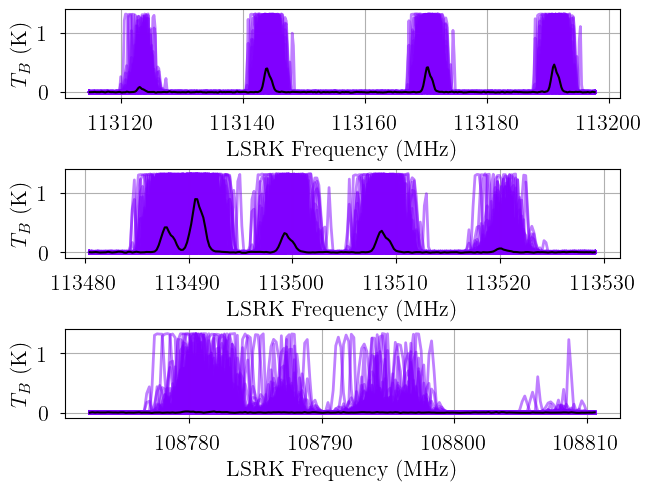

In [9]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [10]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.05, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 3300
Interrupted at 3,299 [3%]: Average Loss = 49,302


Output()

Runtime: 0.21 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

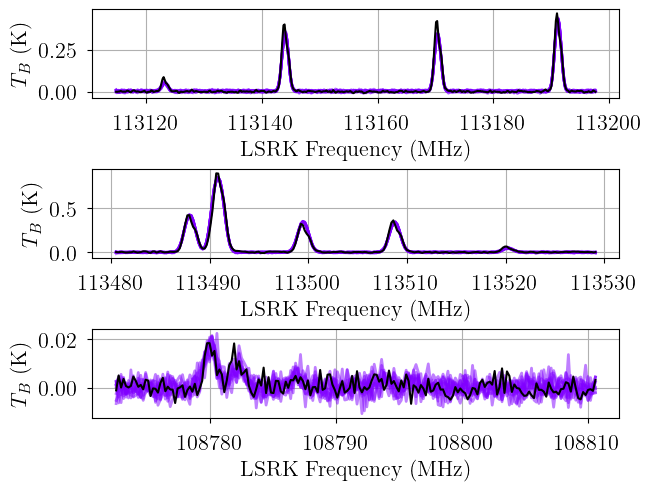

In [11]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [12]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.05,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 3300
Interrupted at 3,299 [3%]: Average Loss = 49,302
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_13C_12C_norm]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 11 seconds.


Adding log-likelihood to trace


Output()

Runtime: 0.54 minutes


In [13]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


In [14]:
# Add 12C/13C to trace
model.trace.solution_0["ratio_12C_13C"] = 1.0/model.trace.solution_0["ratio_13C_12C"]

In [15]:
print("solutions:", model.solutions)

pm.summary(model.trace.solution_0)

solutions: [0]


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],3.340000e-01,5.000000e-02,2.380000e-01,4.270000e-01,1.000000e-03,0.000000e+00,8703.0,6778.0,1.0
baseline_12CN-2_norm[0],-1.076000e+00,6.800000e-02,-1.207000e+00,-9.510000e-01,1.000000e-03,1.000000e-03,7782.0,6964.0,1.0
baseline_13CN_norm[0],-6.200000e-02,7.800000e-02,-2.070000e-01,8.500000e-02,1.000000e-03,1.000000e-03,8335.0,6869.0,1.0
velocity_norm[0],1.500000e-01,1.000000e-03,1.480000e-01,1.520000e-01,0.000000e+00,0.000000e+00,9605.0,6677.0,1.0
log10_N_12CN_norm[0],5.650000e-01,1.000000e-03,5.630000e-01,5.670000e-01,0.000000e+00,0.000000e+00,6923.0,6552.0,1.0
fwhm_nonthermal_norm[0],3.186000e+00,6.000000e-03,3.175000e+00,3.198000e+00,0.000000e+00,0.000000e+00,7954.0,6268.0,1.0
ratio_13C_12C_norm[0],2.270000e-01,1.700000e-02,1.940000e-01,2.590000e-01,0.000000e+00,0.000000e+00,7981.0,6075.0,1.0
velocity[0],4.510000e-01,3.000000e-03,4.450000e-01,4.560000e-01,0.000000e+00,0.000000e+00,9605.0,6677.0,1.0
fwhm_thermal_12CN[0],9.000000e-02,0.000000e+00,9.000000e-02,9.000000e-02,0.000000e+00,NaN,8000.0,8000.0,NaN
fwhm_thermal_13CN[0],8.800000e-02,0.000000e+00,8.800000e-02,8.800000e-02,0.000000e+00,0.000000e+00,8000.0,8000.0,NaN


We find a smaller $^{12}{\rm C}/^{13}{\rm C}$ ratio: $44.4 \pm 3.4$ compared to Sun et al. (2024) who found $52.2 \pm 6.7$ using the traditional HfS method, and $72.2 \pm 9.5$ using the satellite-line method.

Sampling: [12CN-1, 12CN-2, 13CN]


Output()

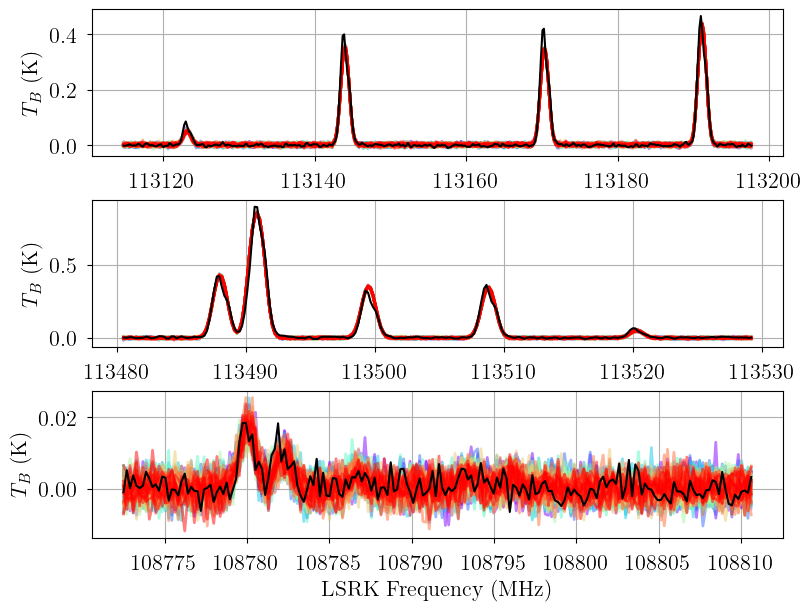

In [16]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
axes.ravel()[1].set_xlabel(None)
fig.set_size_inches(8, 6)

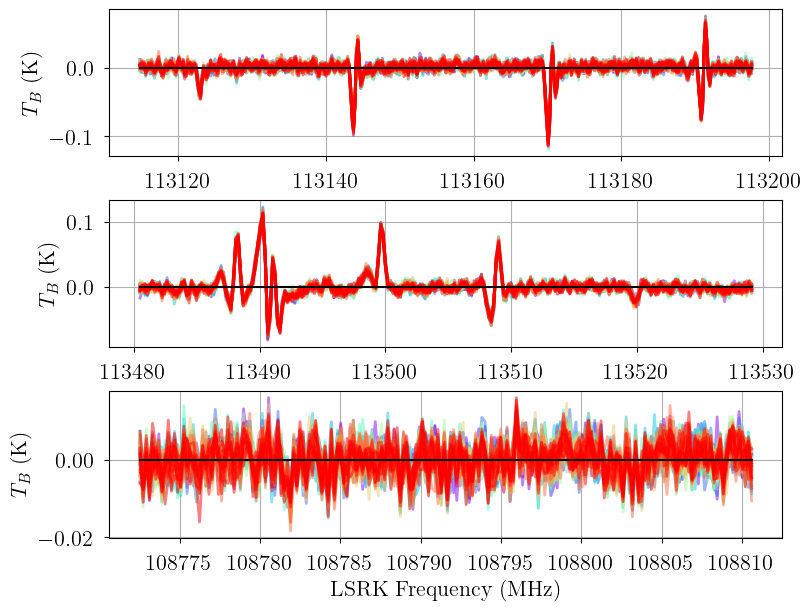

In [17]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

axes = plot_predictive(res_data, posterior.posterior_predictive_residuals)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
axes.ravel()[1].set_xlabel(None)
fig.set_size_inches(8, 6)

['velocity', 'fwhm_nonthermal', 'fwhm_12CN', 'fwhm_13CN', 'log10_N_12CN', 'ratio_13C_12C', 'N_13CN', 'tau_total_12CN', 'tau_total_13CN']


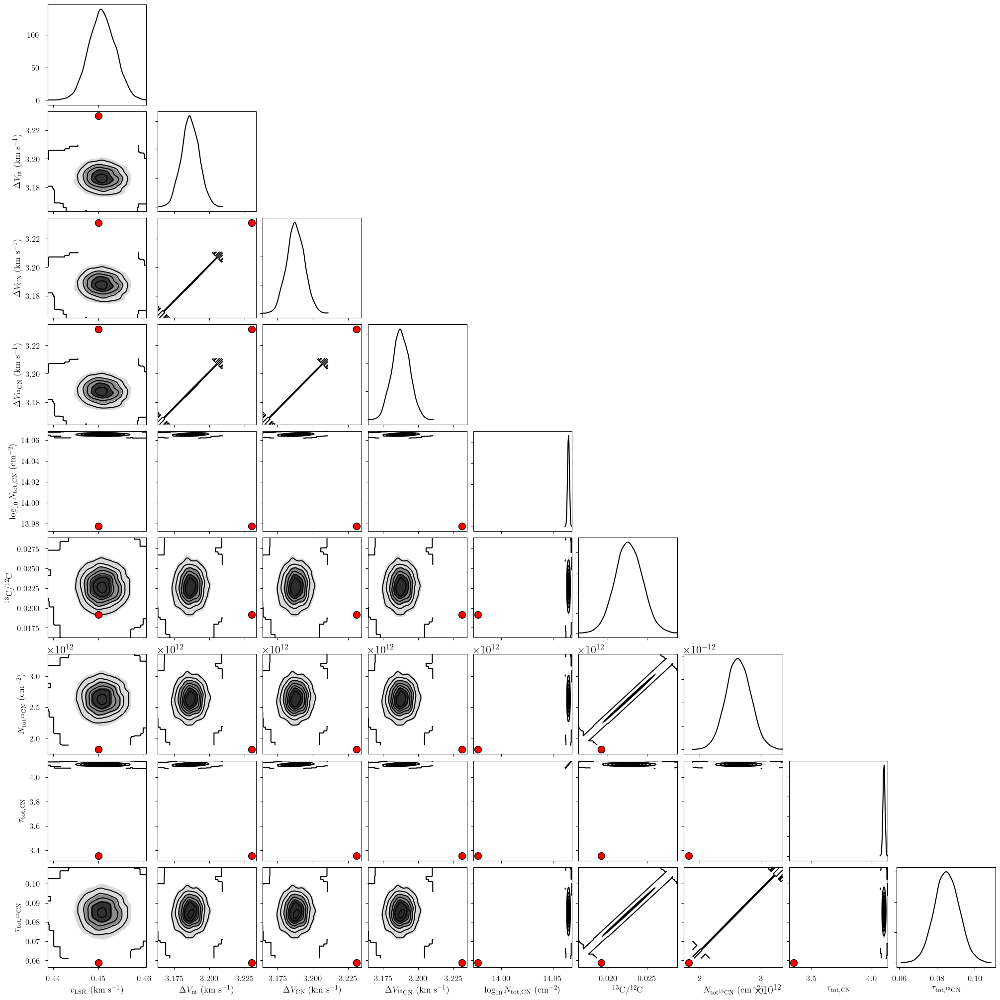

In [18]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(
        ["transition_12CN", "state_12CN", "transition_13CN", "state_13CN"]
    )) and param not in ["fwhm_thermal_12CN", "fwhm_thermal_13CN", "log10_Tex_ul"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
    reference_values=sim_params, # Sun et al. model
)

## Single component LTE
Mimic Sun et al. (2024) analysis, letting the excitation (kinetic) temperature be free. Assuming LTE and CTEX.

In [19]:
# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=1.0, # Main beam efficiency
    Feff=1.0, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = [1.0, 0.5], # mean and width of log10 kinetic temperature prior (K)
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = True, # assume kinetic temperature = excitation temperature
    prior_log10_Tex = None, # ignored for this LTE model
    assume_CTEX = True, # assume CTEX
    prior_log10_LTE_precision = None, # ignored for this LTE model
    fix_log10_Tkin = None, # do not fix the kinetic temperature
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tkin_norm, velocity_norm]


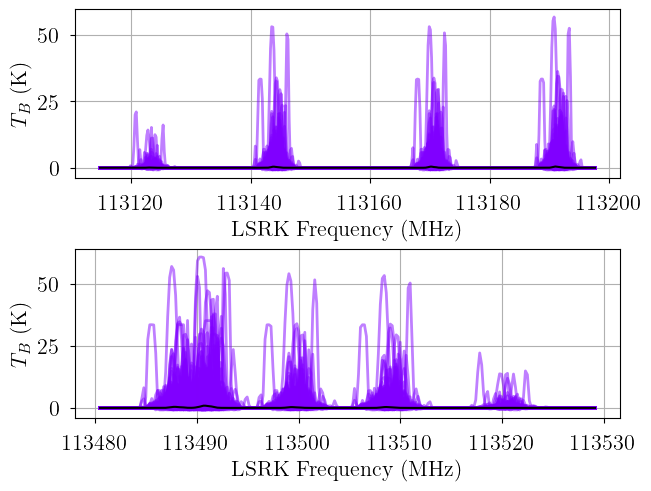

In [20]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [21]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.05, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 4400
Interrupted at 4,399 [4%]: Average Loss = 1.9543e+05


Output()

Runtime: 0.16 minutes


Sampling: [12CN-1, 12CN-2]


Output()

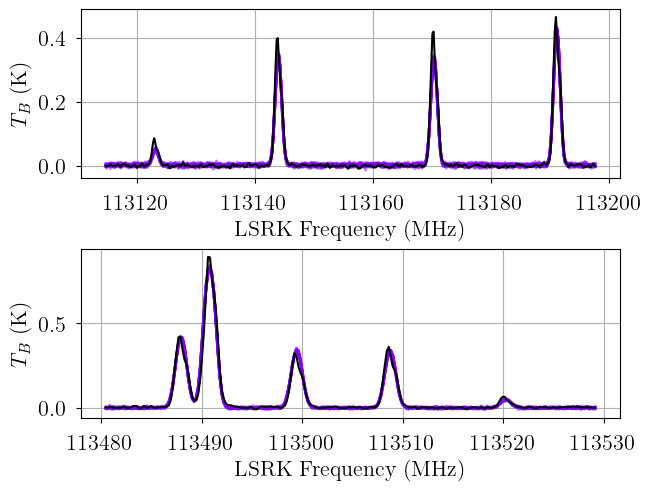

In [22]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [23]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.05,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.8}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 4400
Interrupted at 4,399 [4%]: Average Loss = 1.9543e+05
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, log10_Tkin_norm, fwhm_nonthermal_norm, log10_N_norm]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 17 seconds.


Adding log-likelihood to trace


Output()

Runtime: 0.58 minutes


In [24]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


Sampling: [12CN-1, 12CN-2]


Output()

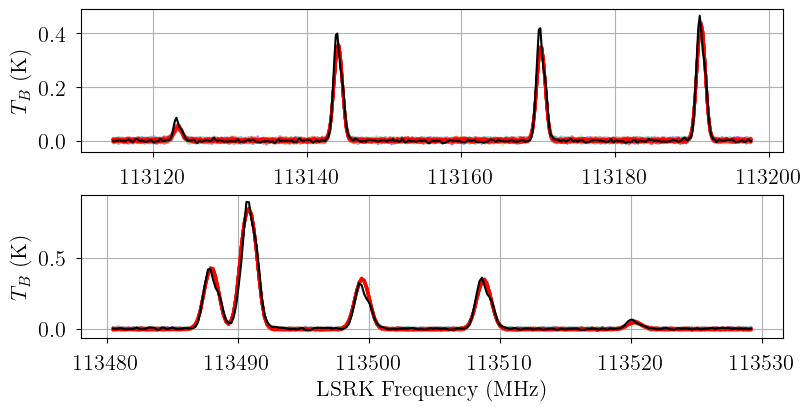

In [25]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

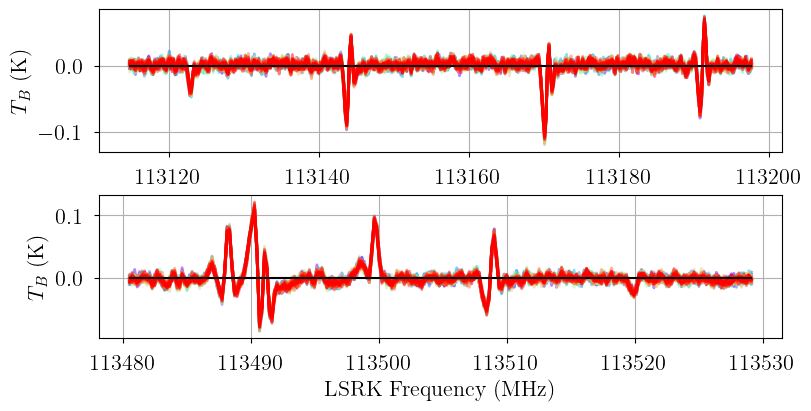

In [26]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

axes = plot_predictive(res_data_12CN, posterior.posterior_predictive_residuals)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

In [27]:
pm.summary(model.trace.solution_0)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],0.323,0.049,0.228,0.413,0.001,0.001,8887.0,4988.0,1.0
baseline_12CN-2_norm[0],-1.074,0.068,-1.202,-0.944,0.001,0.001,7284.0,5606.0,1.0
velocity_norm[0],0.150,0.001,0.149,0.152,0.000,0.000,8623.0,5339.0,1.0
log10_Tkin_norm[0],-0.739,0.003,-0.744,-0.734,0.000,0.000,4059.0,4864.0,1.0
log10_N_norm[0],0.542,0.003,0.536,0.549,0.000,0.000,4114.0,4676.0,1.0
fwhm_nonthermal_norm[0],3.181,0.007,3.168,3.194,0.000,0.000,7182.0,5424.0,1.0
velocity[0],0.451,0.003,0.446,0.457,0.000,0.000,8623.0,5339.0,1.0
log10_Tkin[0],0.631,0.001,0.628,0.633,0.000,0.000,4059.0,4864.0,1.0
fwhm_thermal[0],0.087,0.000,0.086,0.087,0.000,0.000,4059.0,4864.0,1.0
fwhm_nonthermal[0],3.181,0.007,3.168,3.194,0.000,0.000,7182.0,5424.0,1.0


['velocity', 'log10_Tkin', 'fwhm_thermal', 'fwhm_nonthermal', 'fwhm', 'log10_N', 'log10_Tex_ul', 'tau_total']


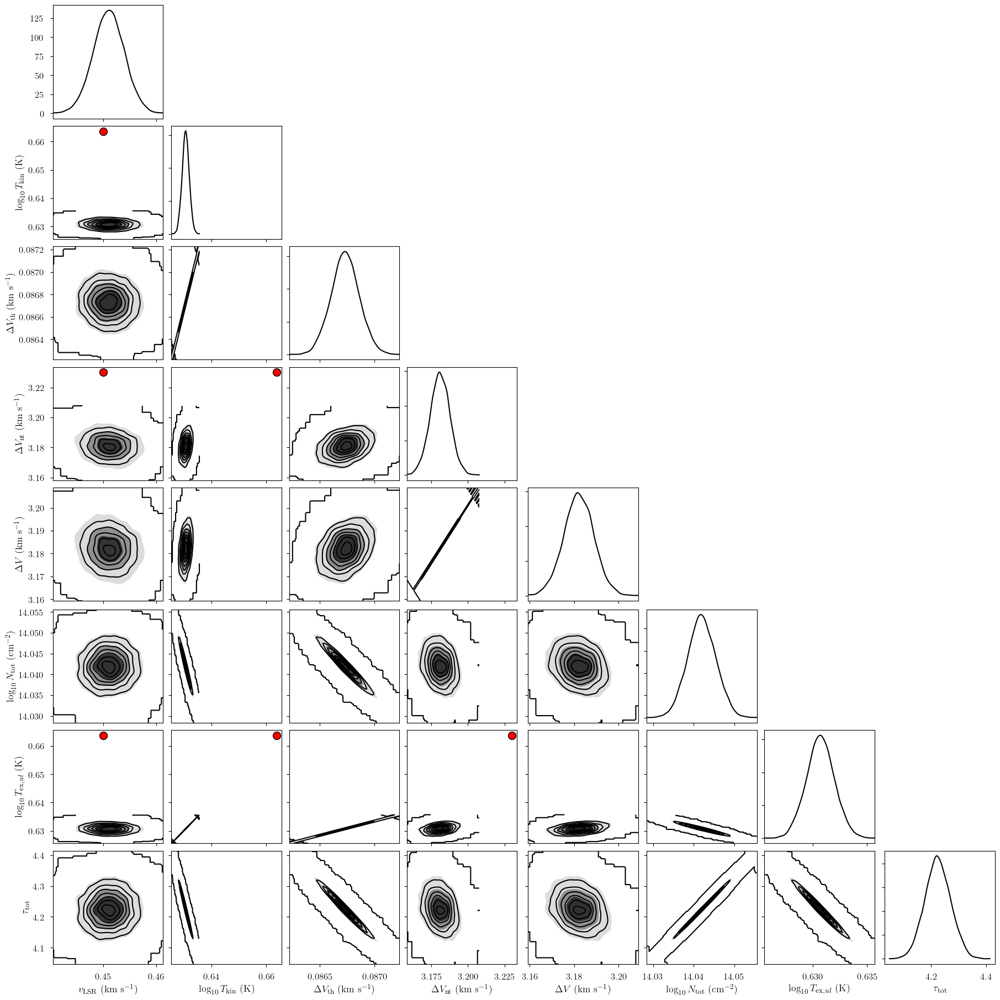

In [28]:
from bayes_spec.plots import plot_pair

# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "state"]))
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + model.hyper_freeRVs, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
    reference_values=sim_params, # Sun et al. results
)

Similar to the Sun et al. results.

## Non-LTE model
Fix the kinetic temperature

In [29]:
# Initialize and define the model
baseline_degree = 0
n_clouds = 1
model = CNModel(
    data_12CN,
    molecule="CN", # molecule (either "CN" or "13CN")
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=1.0, # Main beam efficiency
    Feff=1.0, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = None, # ignored
    prior_velocity = [0.0, 3.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of log10 excitation temperature prior (K)
    assume_CTEX = False, # do not assume CTEX
    prior_log10_LTE_precision = [-6.0, 1.0], # offset and width of log10 LTE precision prior
    fix_log10_Tkin = 0.5, # fix the kinetic temperature
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_nonthermal_norm, log10_LTE_precision_norm, log10_N_norm, log10_Tex_ul_norm, velocity_norm, weights]


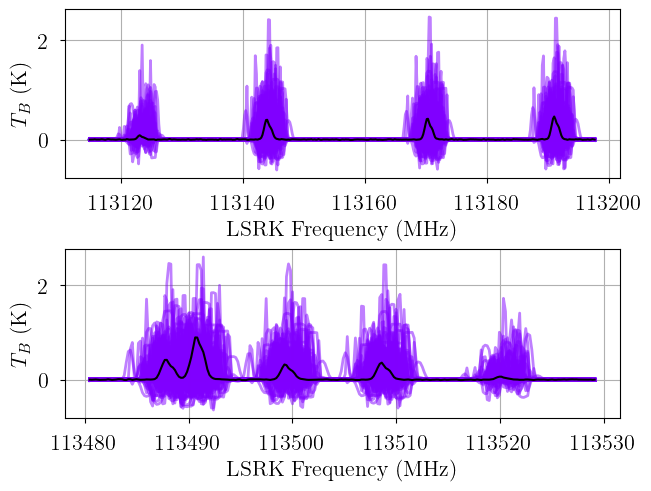

In [30]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [31]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.05, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 7600
Interrupted at 7,599 [7%]: Average Loss = 1.0276e+11


Output()

Runtime: 0.27 minutes


Sampling: [12CN-1, 12CN-2]


Output()

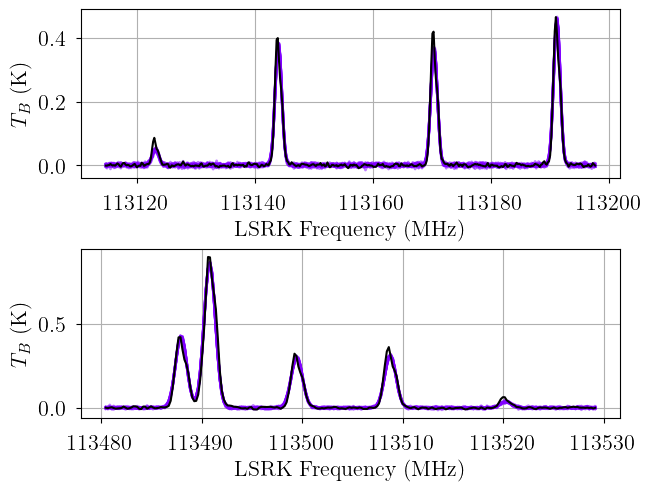

In [32]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [33]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.05,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.9}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 7600
Interrupted at 7,599 [7%]: Average Loss = 1.0276e+11
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 131 seconds.


Adding log-likelihood to trace


Output()

Runtime: 2.64 minutes


In [34]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


Sampling: [12CN-1, 12CN-2]


Output()

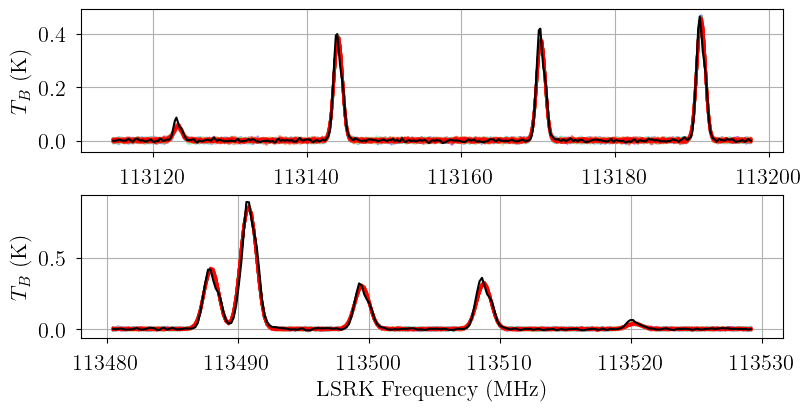

In [35]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

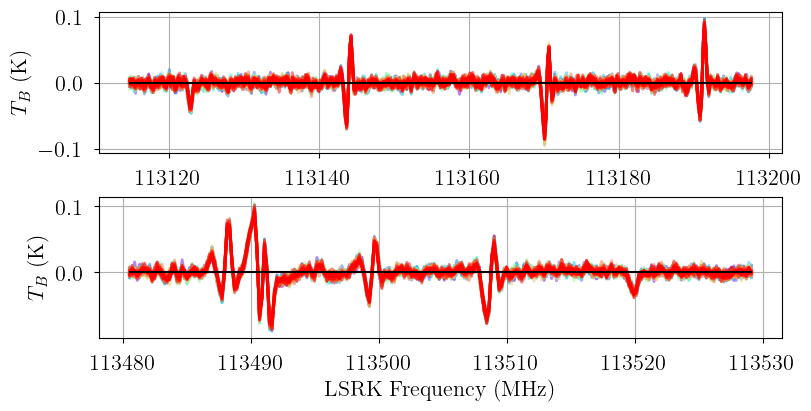

In [36]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

axes = plot_predictive(res_data_12CN, posterior.posterior_predictive_residuals)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

In [37]:
pm.summary(model.trace.solution_0)

/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-0.099,0.051,-0.195,-0.002,0.001,0.001,6637.0,5261.0,1.00
baseline_12CN-2_norm[0],-0.394,0.071,-0.522,-0.253,0.001,0.001,6665.0,4873.0,1.00
velocity_norm[0],0.152,0.001,0.150,0.153,0.000,0.000,7152.0,5316.0,1.00
log10_N_norm[0],0.384,0.015,0.357,0.412,0.000,0.000,1350.0,2034.0,1.01
log10_Tex_ul_norm[0],2.105,0.184,1.766,2.463,0.003,0.003,2841.0,3482.0,1.00
fwhm_nonthermal_norm[0],3.290,0.012,3.268,3.312,0.000,0.000,1759.0,2865.0,1.01
log10_LTE_precision_norm[0],2.494,0.243,2.065,2.950,0.004,0.003,5278.0,4517.0,1.00
"weights[0, 0 0 1 1]",0.156,0.002,0.151,0.161,0.000,0.000,1433.0,2244.0,1.01
"weights[0, 0 0 1 2]",0.332,0.004,0.324,0.339,0.000,0.000,1385.0,2128.0,1.01
"weights[0, 1 0 1 1]",0.062,0.001,0.060,0.064,0.000,0.000,1383.0,2087.0,1.01


This model is both physically consistent and a better match to the data. There appears to be evidence for multiple cloud components. Note the variability in the excitation temperature, especially between the satellite lines.

['velocity', 'fwhm_nonthermal', 'fwhm', 'log10_N', 'log10_Tex_ul', 'log10_LTE_precision', 'tau_total']


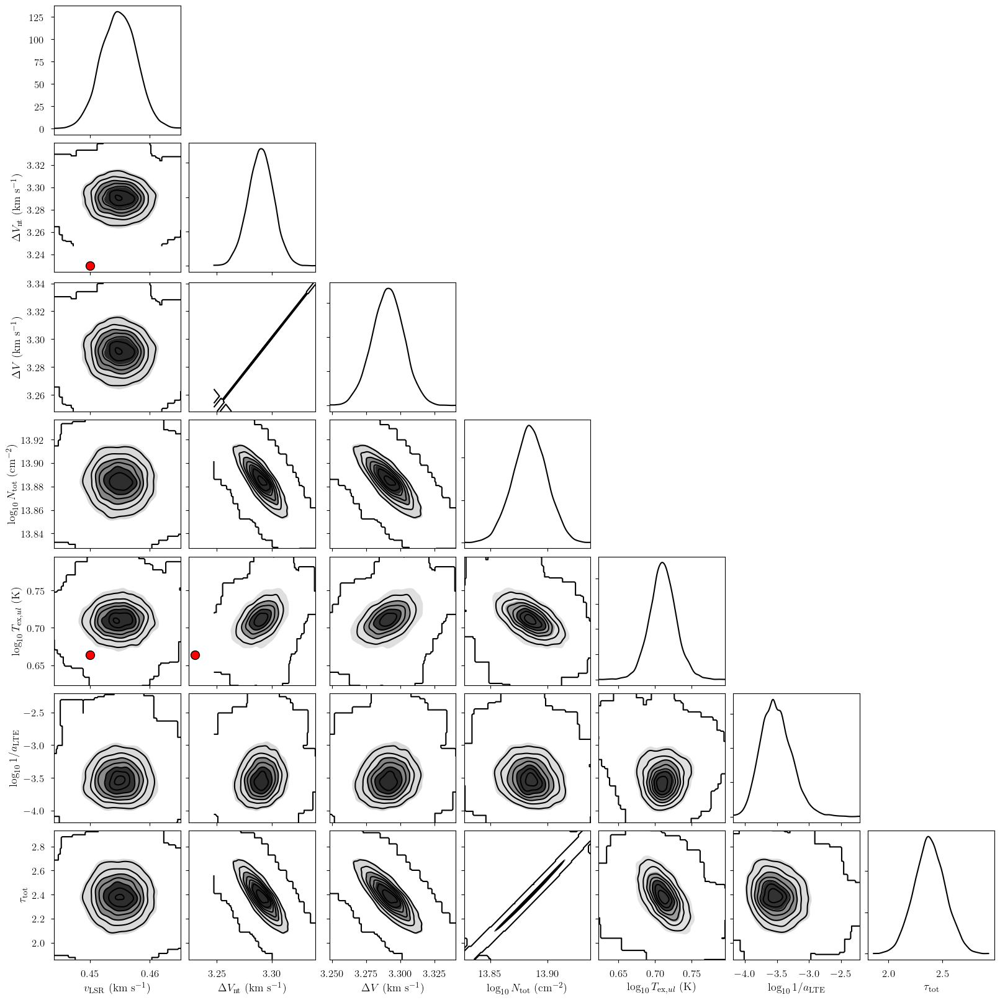

In [38]:
# ignore transition and state dependent parameters
var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "state"]))
    and param not in ["fwhm_thermal"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
    reference_values=sim_params, # sun et al. model
)

## Number of clouds

In [55]:
from bayes_spec import Optimize
from bayes_cn_hfs import CNModel

max_n_clouds = 8
baseline_degree = 0
opt = Optimize(
    CNModel,
    data_12CN,
    molecule="CN", # molecule name
    mol_data=mol_data_12CN, # molecular data
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=1.0, # Main beam efficiency
    Feff=1.0, # Forward efficiency
    max_n_clouds=max_n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
opt.add_priors(
    prior_log10_N = [13.5, 1.0], # mean and width of log10 total column density prior (cm-2)
    prior_log10_Tkin = None, # ignored
    prior_velocity = [0.0, 1.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of log10 excitation temperature prior (K)
    assume_CTEX = False, # do not assume CTEX
    prior_log10_LTE_precision = [-6.0, 1.0], # offset and width of log10 LTE precision prior
    fix_log10_Tkin = 0.5, # fix the kinetic temperature
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
opt.add_likelihood()

Sampling: [12CN-1, 12CN-2, baseline_12CN-1_norm, baseline_12CN-2_norm, fwhm_nonthermal_norm, log10_LTE_precision_norm, log10_N_norm, log10_Tex_ul_norm, velocity_norm, weights]


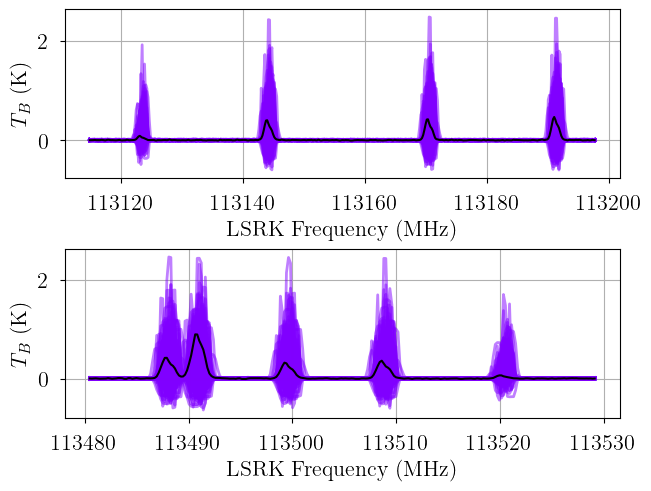

In [56]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = opt.models[1].sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(opt.models[1].data, prior.prior_predictive)

In [60]:
start = time.time()
fit_kwargs = {
    "n": 100_000,
    "rel_tolerance": 0.05,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
opt.fit_all(**fit_kwargs)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Null hypothesis BIC = 4.670e+05
Approximating n_cloud = 1 posterior...


Output()

Convergence achieved at 8500
Interrupted at 8,499 [8%]: Average Loss = 7.3995e+10


Output()

n_cloud = 1 BIC = 2.907e+03

Approximating n_cloud = 2 posterior...


Output()

Convergence achieved at 19200
Interrupted at 19,199 [19%]: Average Loss = 1.6385e+24


Output()

n_cloud = 2 BIC = 8.004e+02

Approximating n_cloud = 3 posterior...


Output()

Convergence achieved at 45300
Interrupted at 45,299 [45%]: Average Loss = 6.3607e+25


Output()

n_cloud = 3 BIC = -3.418e+03

Approximating n_cloud = 4 posterior...


Output()

Convergence achieved at 56900
Interrupted at 56,899 [56%]: Average Loss = 5.7749e+25


Output()

n_cloud = 4 BIC = -4.132e+03

Approximating n_cloud = 5 posterior...


Output()

Finished [100%]: Average Loss = -2,415


Output()

n_cloud = 5 BIC = -5.118e+03

Approximating n_cloud = 6 posterior...


Output()

Finished [100%]: Average Loss = -2,214.1


Output()

n_cloud = 6 BIC = -4.605e+03

Approximating n_cloud = 7 posterior...


Output()

Finished [100%]: Average Loss = -2,428.4


Output()

n_cloud = 7 BIC = -4.818e+03

Approximating n_cloud = 8 posterior...


Output()

Finished [100%]: Average Loss = -2,417.1


Output()

n_cloud = 8 BIC = -4.945e+03

Runtime: 13.61 minutes


[467024.12067116   2907.36750836    800.40411344  -3418.31897192
  -4132.29641226  -5117.88994813  -4605.29954114  -4817.69449359
  -4945.05394847]


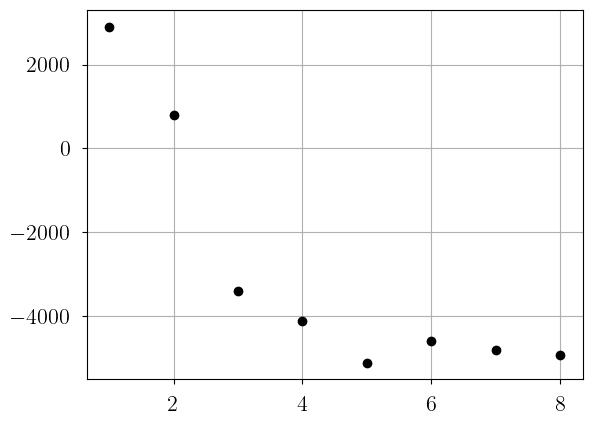

In [61]:
null_bic = opt.models[1].null_bic()
n_clouds = np.arange(max_n_clouds+1)
bics_vi = np.array([null_bic] + [model.bic(chain=0) for model in opt.models.values()])
print(bics_vi)

plt.plot(n_clouds[1:], bics_vi[1:], 'ko')

In [62]:
start = time.time()
fit_kwargs = {
    "rel_tolerance": 0.05,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
sample_kwargs = {
    "chains": 8,
    "cores": 8,
    "n_init": 100_000,
    "tune": 1000,
    "draws": 1000,
    "init_kwargs": fit_kwargs,
    "nuts_kwargs": {"target_accept": 0.9},
}
opt.optimize(fit_kwargs=fit_kwargs, sample_kwargs=sample_kwargs, approx=False)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Null hypothesis BIC = 4.670e+05
Sampling n_cloud = 1 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 8500
Interrupted at 8,499 [8%]: Average Loss = 7.3995e+10
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 132 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 1 solution = 0 BIC = 2.689e+03

Sampling n_cloud = 2 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 19200
Interrupted at 19,199 [19%]: Average Loss = 1.6385e+24
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1661 seconds.


Adding log-likelihood to trace


Output()

There were 4 divergences in converged chains.
GMM converged to unique solution
n_cloud = 2 solution = 0 BIC = -3.141e+03

Sampling n_cloud = 3 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 45300
Interrupted at 45,299 [45%]: Average Loss = 6.3607e+25
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1648 seconds.


Adding log-likelihood to trace


Output()

There were 1863 divergences in converged chains.
GMM converged to unique solution
6 of 8 chains appear converged.
n_cloud = 3 solution = 0 BIC = -5.113e+03

Sampling n_cloud = 4 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 56900
Interrupted at 56,899 [56%]: Average Loss = 5.7749e+25
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 1326 seconds.


Adding log-likelihood to trace


Output()

GMM converged to unique solution
n_cloud = 4 solution = 0 BIC = -5.225e+03

Sampling n_cloud = 5 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Finished [100%]: Average Loss = -2,415
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 2458 seconds.


Adding log-likelihood to trace


Output()

There were 420 divergences in converged chains.
GMM converged to unique solution
2 of 8 chains appear converged.
n_cloud = 5 solution = 0 BIC = -5.218e+03

Stopping criteria met.
Sampling n_cloud = 6 posterior...
Initializing NUTS using custom advi+adapt_diag strategy


Output()

Finished [100%]: Average Loss = -2,214.1
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 3115 seconds.


Adding log-likelihood to trace


Output()

There were 37 divergences in converged chains.
No solution found!
0 of 8 chains appear converged.

Stopping criteria met.
Stopping early.
Runtime: 182.02 minutes


[467024.12067116   2688.60020389  -3141.28635865  -5113.15568045
  -5224.72328742  -5218.43920218             nan             nan
             nan]


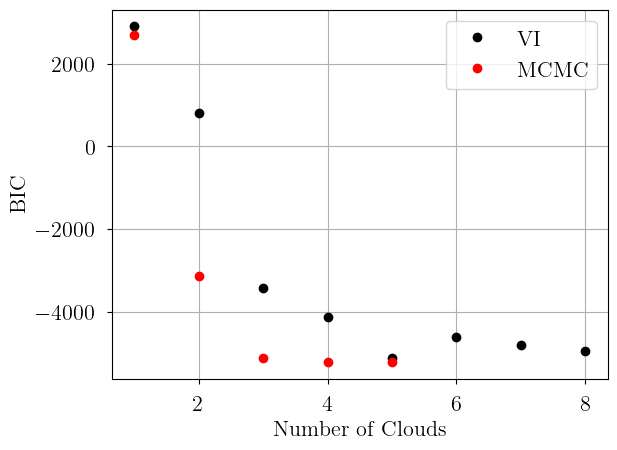

In [63]:
null_bic = opt.models[1].null_bic()
n_clouds = np.arange(max_n_clouds+1)
bics_mcmc = np.array([null_bic] + [model.bic(solution=0) if len(model.solutions) > 0 else np.nan for model in opt.models.values()])
print(bics_mcmc)

plt.plot(n_clouds[1:], bics_vi[1:], 'ko', label="VI")
plt.plot(n_clouds[1:], bics_mcmc[1:], 'ro', label="MCMC")
plt.xlabel("Number of Clouds")
plt.ylabel("BIC")
_ = plt.legend()

In [64]:
import dill

with open("g211.59_opt.pkl", "wb") as f:
    dill.dump(opt, f)

In [ ]:
with open("g211.59_opt.pkl", "rb") as f:
    opt = dill.load(f)

In [85]:
model = opt.best_model
model = opt.models[3]
print(model.n_clouds)
model.solve()

pm.summary(model.trace.solution_0)

3
GMM converged to unique solution
6 of 8 chains appear converged.


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-0.123,0.051,-0.217,-0.030,0.001,0.001,7709.0,4720.0,1.00
baseline_12CN-2_norm[0],-0.336,0.072,-0.474,-0.203,0.001,0.001,7852.0,4275.0,1.00
velocity_norm[0],-0.473,0.041,-0.550,-0.395,0.001,0.001,1883.0,2939.0,1.00
velocity_norm[1],2.310,0.037,2.238,2.377,0.001,0.000,2445.0,3540.0,1.00
velocity_norm[2],1.251,0.020,1.214,1.288,0.000,0.000,2074.0,3139.0,1.00
log10_N_norm[0],0.362,0.020,0.321,0.398,0.000,0.000,1840.0,2709.0,1.00
log10_N_norm[1],0.213,0.020,0.174,0.250,0.000,0.000,2150.0,3177.0,1.00
log10_N_norm[2],0.683,0.027,0.634,0.735,0.001,0.000,2550.0,2588.0,1.00
log10_Tex_ul_norm[0],0.862,0.108,0.658,1.067,0.002,0.002,2803.0,3386.0,1.00
log10_Tex_ul_norm[1],-0.281,0.055,-0.388,-0.181,0.001,0.001,2092.0,2832.0,1.00


Sampling: [12CN-1, 12CN-2]


Output()

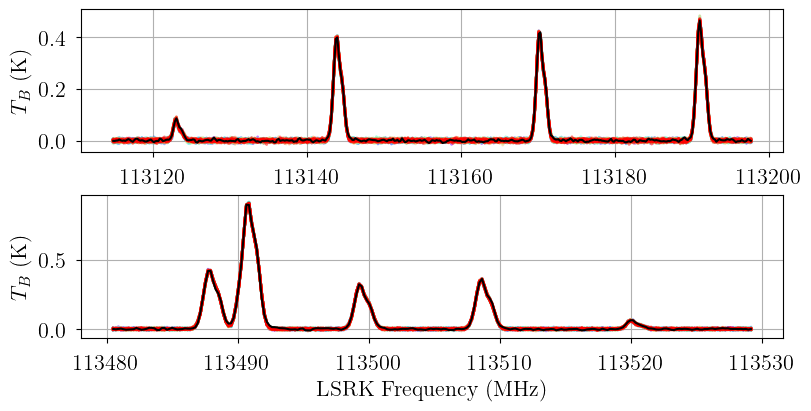

In [86]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
axes = plot_predictive(model.data, posterior.posterior_predictive)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

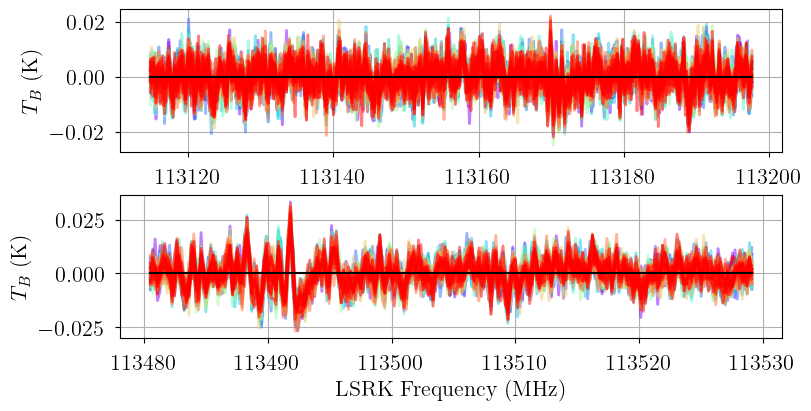

In [87]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

axes = plot_predictive(res_data_12CN, posterior.posterior_predictive_residuals)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

['velocity', 'fwhm_nonthermal', 'fwhm', 'log10_N', 'log10_Tex_ul', 'log10_LTE_precision', 'tau_total']


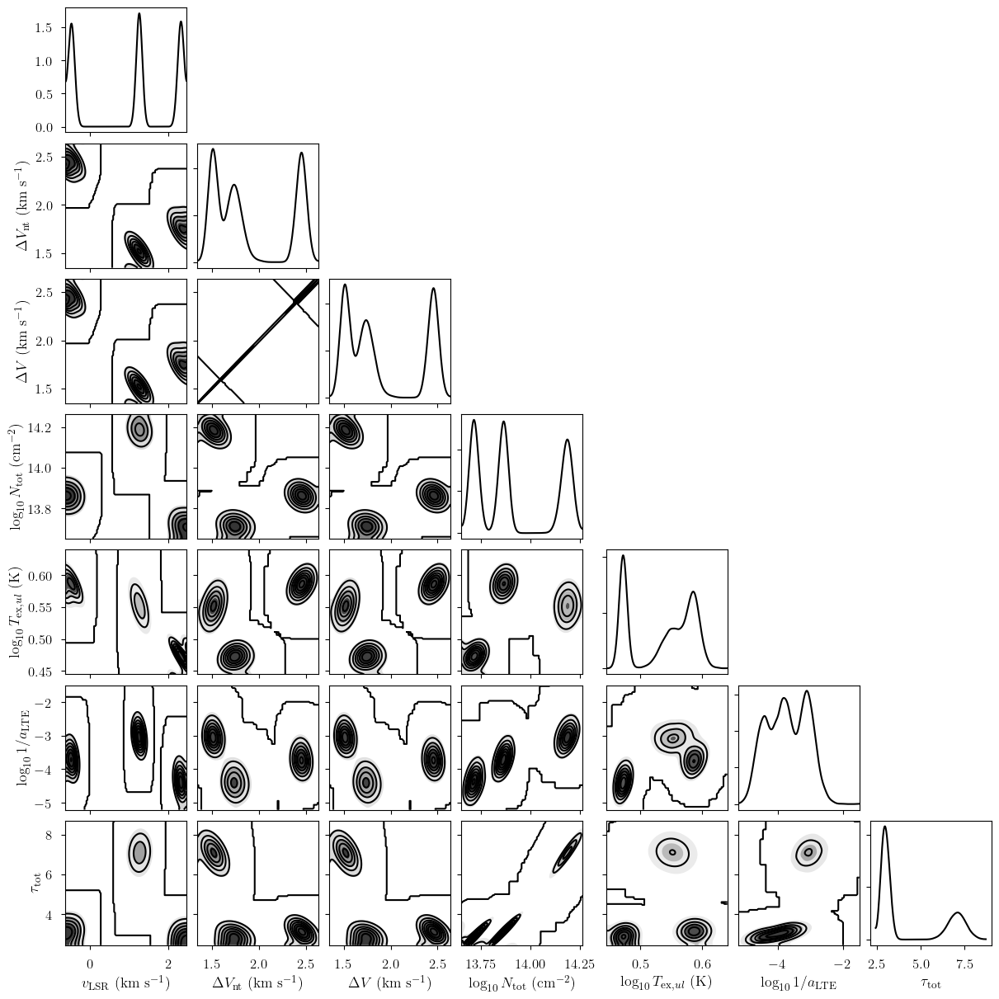

In [88]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(["transition", "state"]))
    and param not in ["fwhm_thermal"]
]
print(var_names)
axes = plot_pair(
    model.trace.solution_0, # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)
_ = axes.ravel()[0].figure.set_size_inches(12, 12)

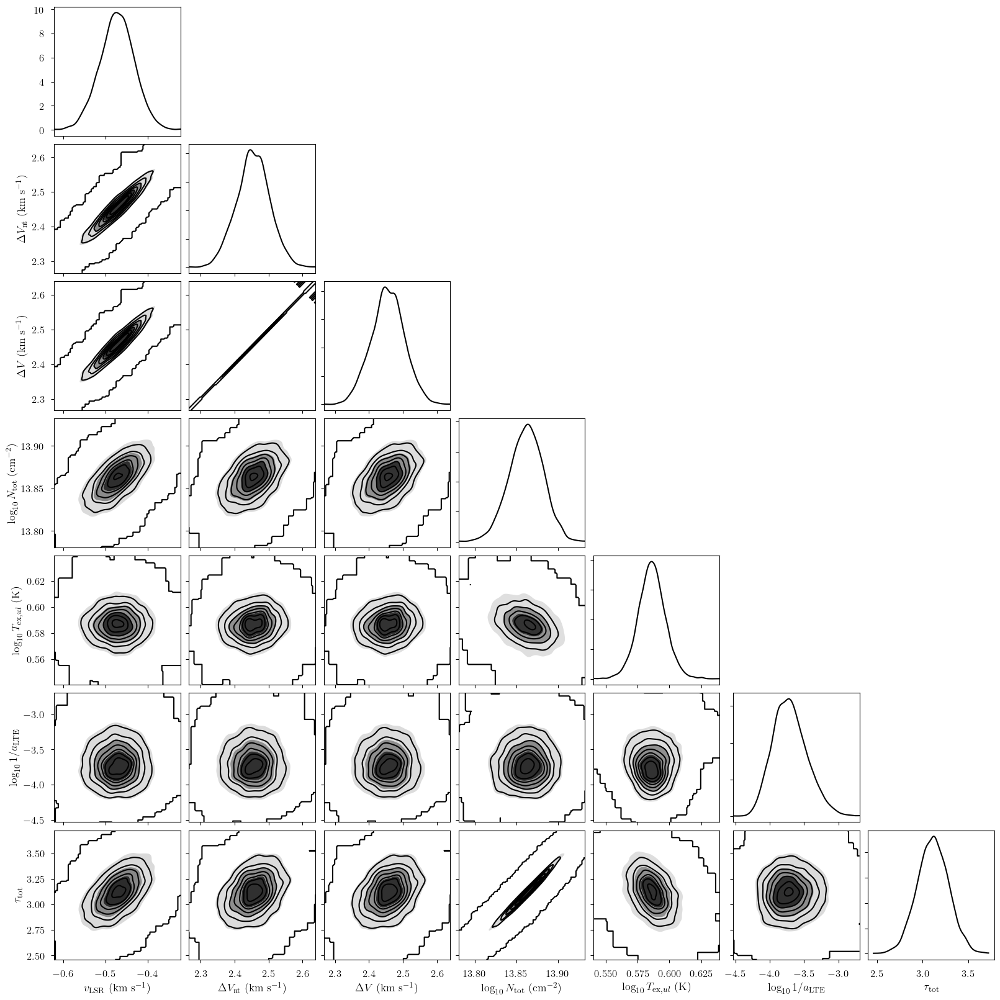

In [89]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

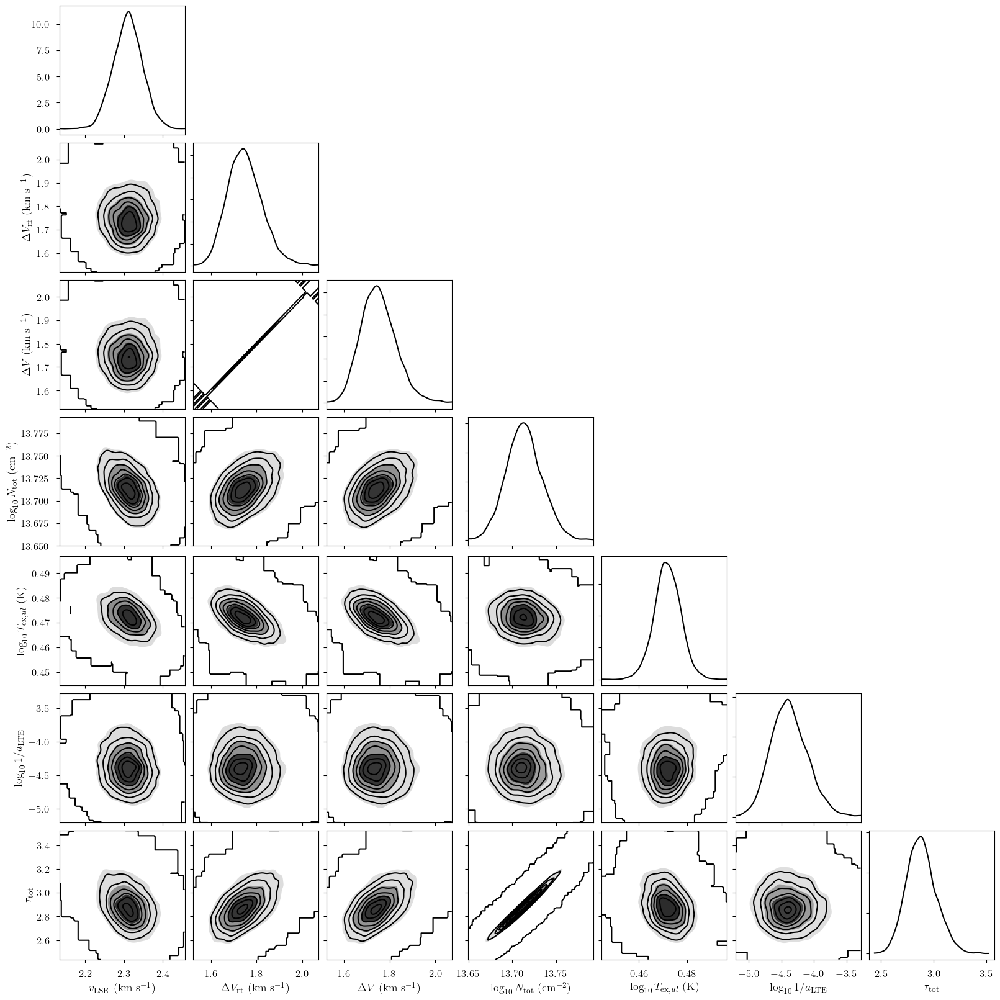

In [90]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1), # samples
    var_names + model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

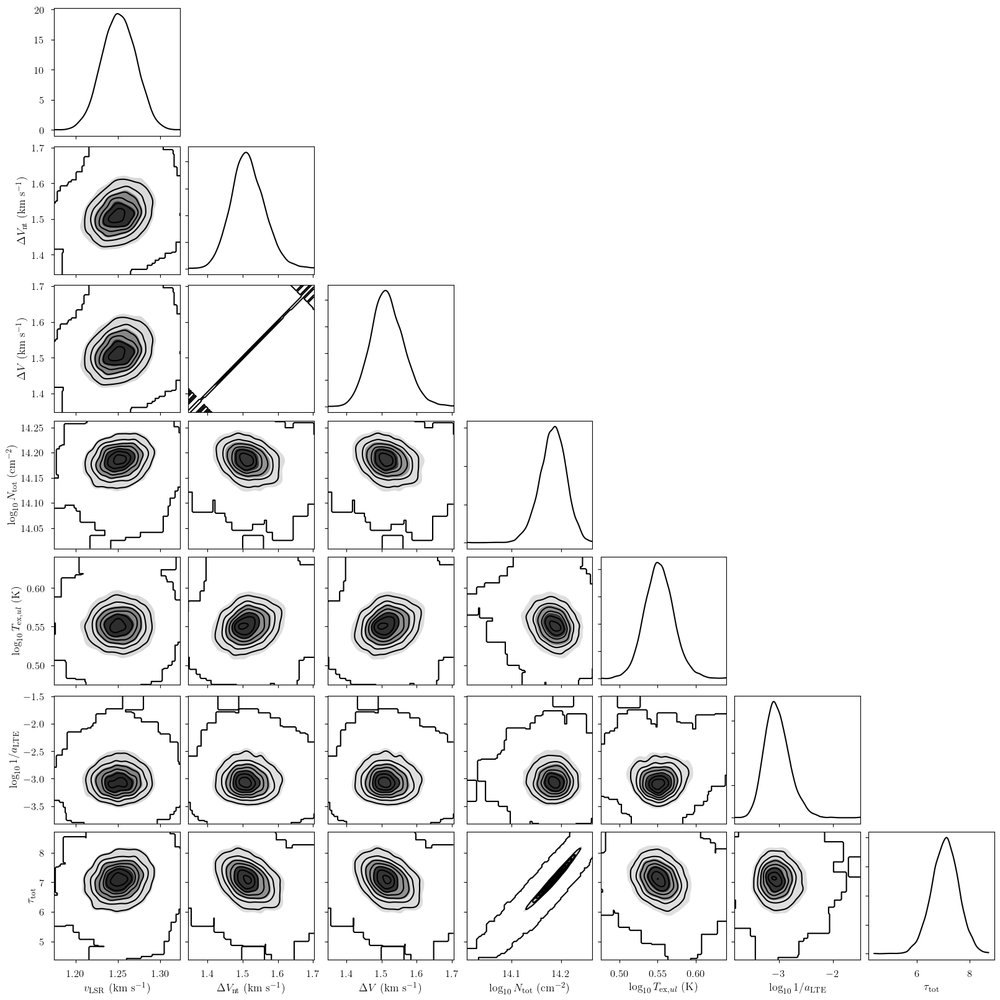

In [91]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2), # samples
    var_names +  model.hyper_deterministics, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

## Ratio Model
We do assume CTEX for 13CN because we do not detect enough 13CN transitions to constrain the 13CN deviations. This results in strong degeneracies between the statistical weights, which is hard to sample numerically. These results are biased by the implicit prior that the 13CN excitation temperature is equal to the 12CN excitation temperature and that 13CN has no hyperfine anomalies.

In [93]:
from bayes_cn_hfs.cn_ratio_model import CNRatioModel

# Initialize and define the model
n_clouds = 3 # number of cloud components
baseline_degree = 0 # polynomial baseline degree
model = CNRatioModel(
    data,
    bg_temp = 2.7, # assumed background temperature (K)
    Beff=1.0, # Main beam efficiency
    Feff=1.0, # Forward efficiency
    n_clouds=n_clouds,
    baseline_degree=baseline_degree,
    seed=1234,
    verbose=True
)
model.add_priors(
    prior_log10_N_12CN = [13.5, 1.0], # mean and width of log10 12CN total column density prior (cm-2)
    prior_ratio_13C_12C = 0.1, # width of 13C/12C ratio prior
    prior_log10_Tkin = None, # ignored
    prior_velocity = [0.0, 1.0], # mean and width of velocity prior (km/s)
    prior_fwhm_nonthermal = 1.0, # width of non-thermal broadening prior (km/s)
    prior_fwhm_L = None, # assume Gaussian line profile
    prior_rms = None, # do not infer spectral rms
    prior_baseline_coeffs = None, # use default baseline priors
    assume_LTE = False, # do not assume LTE
    prior_log10_Tex = [0.5, 0.1], # mean and width of excitation temperature prior (K)
    assume_CTEX_12CN = False, # do not assume CTEX
    prior_log10_LTE_precision = [-6.0, 1.0], # offset and width of LTE precision prior
    assume_CTEX_13CN = True, # assume CTEX for 13CN
    fix_log10_Tkin = 0.5, # kinetic temperature is fixed (K)
    clip_weights = 1.0e-9, # clip statistical weights between [clip_weights, 1-clip_weights]
    clip_tau = -10.0, # clip optical depths below to prevent masers
    ordered = False, # do not assume optically-thin
)
model.add_likelihood()

Sampling: [12CN-1, 12CN-2, 13CN, baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, fwhm_nonthermal_norm, log10_LTE_precision_norm, log10_N_12CN_norm, log10_Tex_ul_norm, ratio_13C_12C_norm, velocity_norm, weights_12CN]


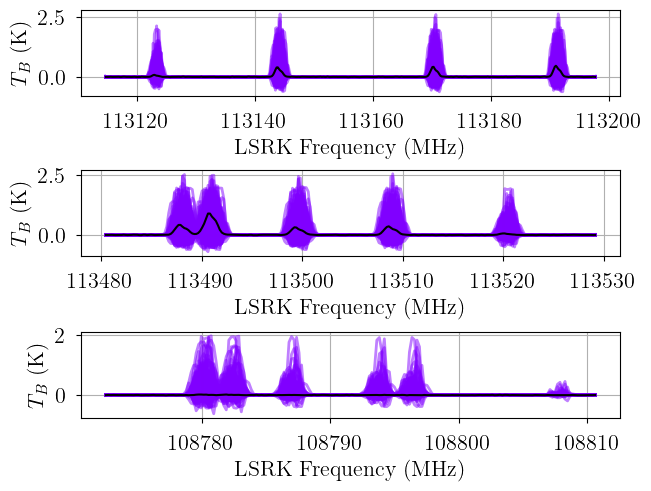

In [94]:
from bayes_spec.plots import plot_predictive

# prior predictive check
prior = model.sample_prior_predictive(
    samples=1000,  # prior predictive samples
)
_ = plot_predictive(model.data, prior.prior_predictive)

In [95]:
start = time.time()
model.fit(
    n = 100_000, # maximum number of VI iterations
    draws = 1_000, # number of posterior samples
    rel_tolerance = 0.05, # VI relative convergence threshold
    abs_tolerance = 0.05, # VI absolute convergence threshold
    learning_rate = 0.01, # VI learning rate
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Output()

Convergence achieved at 58900
Interrupted at 58,899 [58%]: Average Loss = 2.5455e+24


Output()

Runtime: 1.90 minutes


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

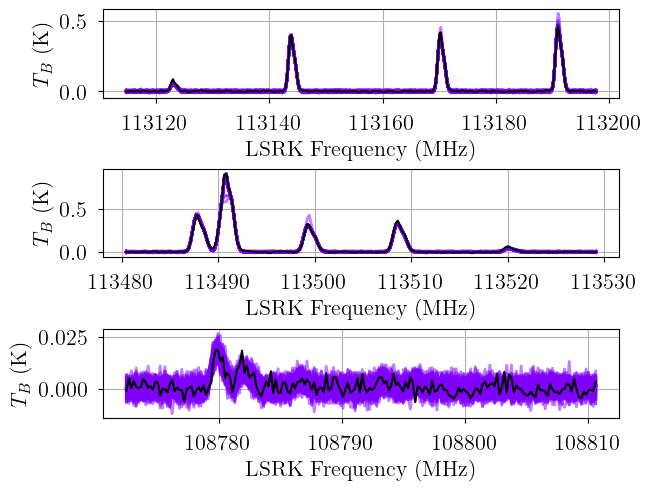

In [96]:
posterior = model.sample_posterior_predictive(
    thin=10, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

In [97]:
start = time.time()
init_kwargs = {
    "rel_tolerance": 0.05,
    "abs_tolerance": 0.05,
    "learning_rate": 0.01,
}
model.sample(
    init = "advi+adapt_diag", # initialization strategy
    tune = 1000, # tuning samples
    draws = 1000, # posterior samples
    chains = 8, # number of independent chains
    cores = 8, # number of parallel chains
    init_kwargs = init_kwargs, # VI initialization arguments
    nuts_kwargs = {"target_accept": 0.9}, # NUTS arguments
)
end = time.time()
print(f"Runtime: {(end-start)/60.0:.2f} minutes")

Initializing NUTS using custom advi+adapt_diag strategy


Output()

Convergence achieved at 58900
Interrupted at 58,899 [58%]: Average Loss = 2.5455e+24
Multiprocess sampling (8 chains in 8 jobs)
NUTS: [baseline_12CN-1_norm, baseline_12CN-2_norm, baseline_13CN_norm, velocity_norm, fwhm_nonthermal_norm, log10_N_12CN_norm, ratio_13C_12C_norm, log10_Tex_ul_norm, log10_LTE_precision_norm, weights_12CN]


Output()

Sampling 8 chains for 1_000 tune and 1_000 draw iterations (8_000 + 8_000 draws total) took 2075 seconds.


Adding log-likelihood to trace


Output()

Runtime: 37.24 minutes


In [98]:
model.solve(kl_div_threshold=0.1)

GMM converged to unique solution


In [99]:
import dill

with open("g211.59_best.pkl", "wb") as f:
    dill.dump(model, f)

In [100]:
# Add 12C/13C to trace
model.trace.solution_0["ratio_12C_13C"] = 1.0/model.trace.solution_0["ratio_13C_12C"]

In [101]:
print("solutions:", model.solutions)

pm.summary(model.trace.solution_0)

solutions: [0]


/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:596: RuntimeWarning: invalid value encountered in scalar divide
  (between_chain_variance / within_chain_variance + num_samples - 1) / (num_samples)
/home/twenger/miniconda3/envs/bayes_spec-dev/lib/python3.13/site-packages/arviz/stats/diagnostics.py:991: RuntimeWarning: invalid value encountered in scalar divide
  varsd = varvar / evar / 4


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
baseline_12CN-1_norm[0],-8.300000e-02,5.100000e-02,-1.740000e-01,1.600000e-02,0.000000e+00,1.000000e-03,12266.0,6162.0,1.00
baseline_12CN-2_norm[0],-2.170000e-01,7.200000e-02,-3.510000e-01,-8.100000e-02,1.000000e-03,1.000000e-03,9857.0,5516.0,1.00
baseline_13CN_norm[0],-6.400000e-02,7.700000e-02,-2.140000e-01,7.800000e-02,1.000000e-03,1.000000e-03,9355.0,6100.0,1.00
velocity_norm[0],6.760000e-01,1.300000e-02,6.510000e-01,6.990000e-01,0.000000e+00,0.000000e+00,2942.0,4319.0,1.00
velocity_norm[1],1.462000e+00,2.100000e-02,1.423000e+00,1.502000e+00,0.000000e+00,0.000000e+00,3624.0,4773.0,1.00
velocity_norm[2],-7.670000e-01,3.700000e-02,-8.350000e-01,-6.970000e-01,1.000000e-03,0.000000e+00,1931.0,3278.0,1.01
log10_N_12CN_norm[0],-6.500000e-02,5.800000e-02,-1.750000e-01,4.300000e-02,1.000000e-03,1.000000e-03,1651.0,2415.0,1.00
log10_N_12CN_norm[1],7.560000e-01,2.900000e-02,7.040000e-01,8.120000e-01,1.000000e-03,0.000000e+00,1477.0,2651.0,1.01
log10_N_12CN_norm[2],-7.300000e-02,4.600000e-02,-1.620000e-01,8.000000e-03,1.000000e-03,1.000000e-03,1775.0,2615.0,1.00
log10_Tex_ul_norm[0],1.522000e+00,3.430000e-01,9.100000e-01,2.198000e+00,8.000000e-03,5.000000e-03,2099.0,3044.0,1.00


Sampling: [12CN-1, 12CN-2, 13CN]


Output()

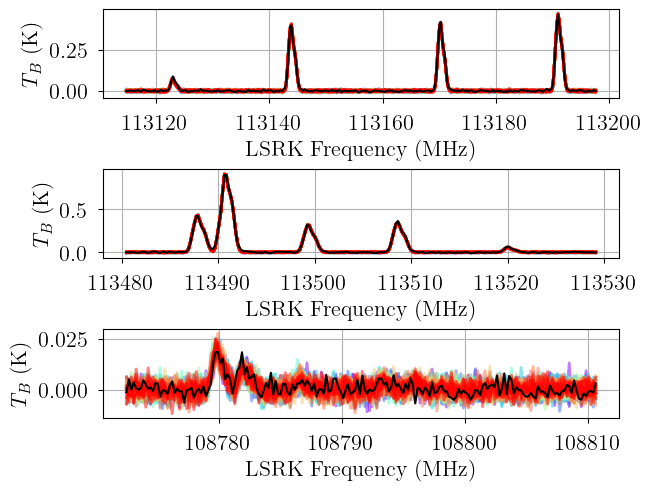

In [102]:
posterior = model.sample_posterior_predictive(
    thin=100, # keep one in {thin} posterior samples
)
_ = plot_predictive(model.data, posterior.posterior_predictive)

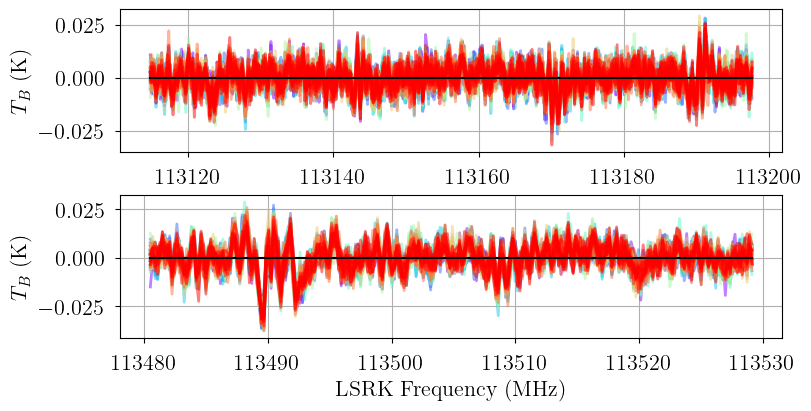

In [103]:
# calculate residuals
posterior["posterior_predictive_residuals"] = posterior.posterior_predictive.copy()
for label in model.data.keys():
    posterior.posterior_predictive_residuals[label] = posterior.posterior_predictive[label] - model.data[label].brightness

axes = plot_predictive(res_data, posterior.posterior_predictive_residuals)
fig = axes.ravel()[0].figure
axes.ravel()[0].set_xlabel(None)
fig.set_size_inches(8, 4)

In [104]:
# 12C/13C ratio over all clouds
for solution in model.solutions:
    model.trace[f"solution_{solution}"]["ratio_12C_13C_total"] = (
        (10.0**model.trace[f"solution_{solution}"]["log10_N_12CN"]).sum(dim="cloud") / 
        model.trace[f"solution_{solution}"]["N_13CN"].sum(dim="cloud")
    )

In [105]:
pm.summary(model.trace.solution_0, var_names=["ratio_12C_13C_total"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
ratio_12C_13C_total,56.8,7.497,44.301,72.246,0.101,0.087,5619.0,5501.0,1.0


['velocity', 'fwhm_nonthermal', 'fwhm_12CN', 'fwhm_13CN', 'log10_N_12CN', 'ratio_13C_12C', 'N_13CN', 'log10_Tex_ul', 'log10_LTE_precision', 'tau_total_12CN', 'tau_total_13CN']


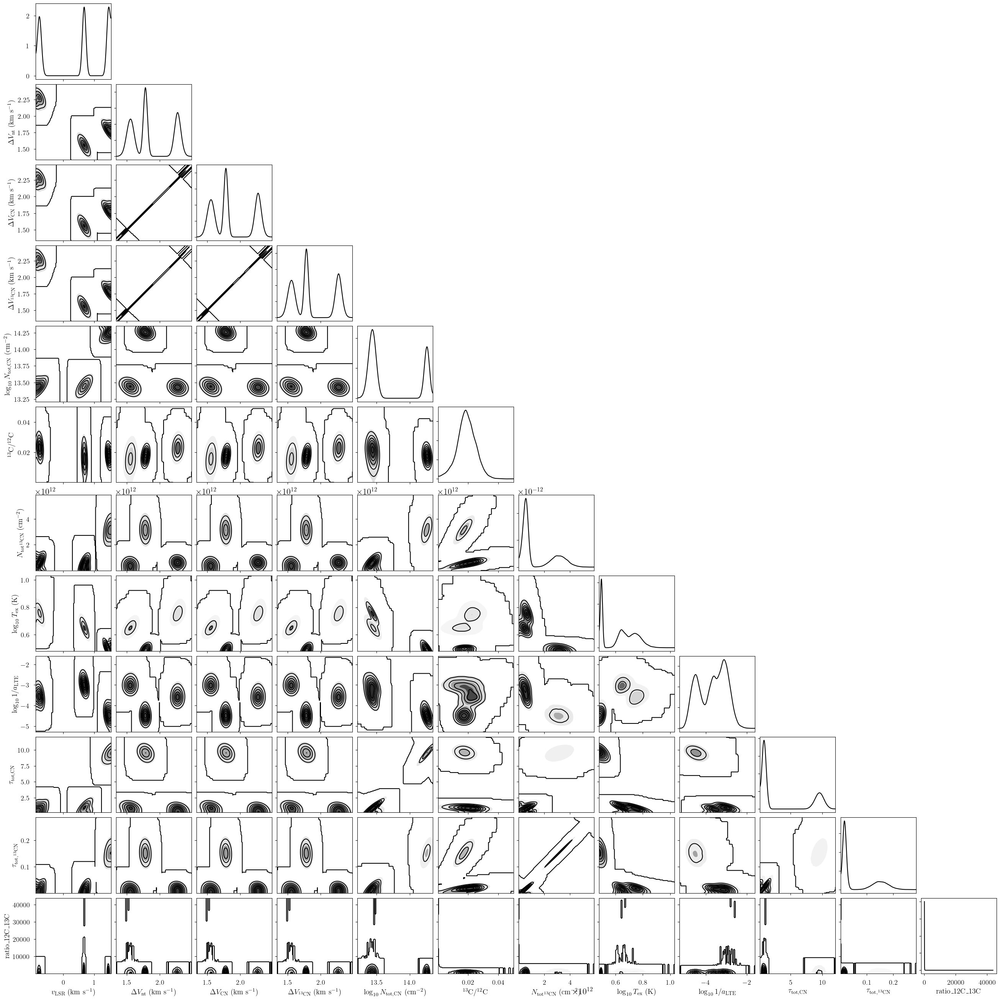

In [106]:
from bayes_spec.plots import plot_pair

var_names = [
    param for param in model.cloud_deterministics
    if not set(model.model.named_vars_to_dims[param]).intersection(set(
        ["transition_12CN", "state_12CN", "transition_13CN", "state_13CN"]
    )) and param not in ["fwhm_thermal_12CN", "fwhm_thermal_13CN"]
]
print(var_names)
_ = plot_pair(
    model.trace.solution_0, # samples
    var_names + ["ratio_12C_13C"], # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde", # plot type
)

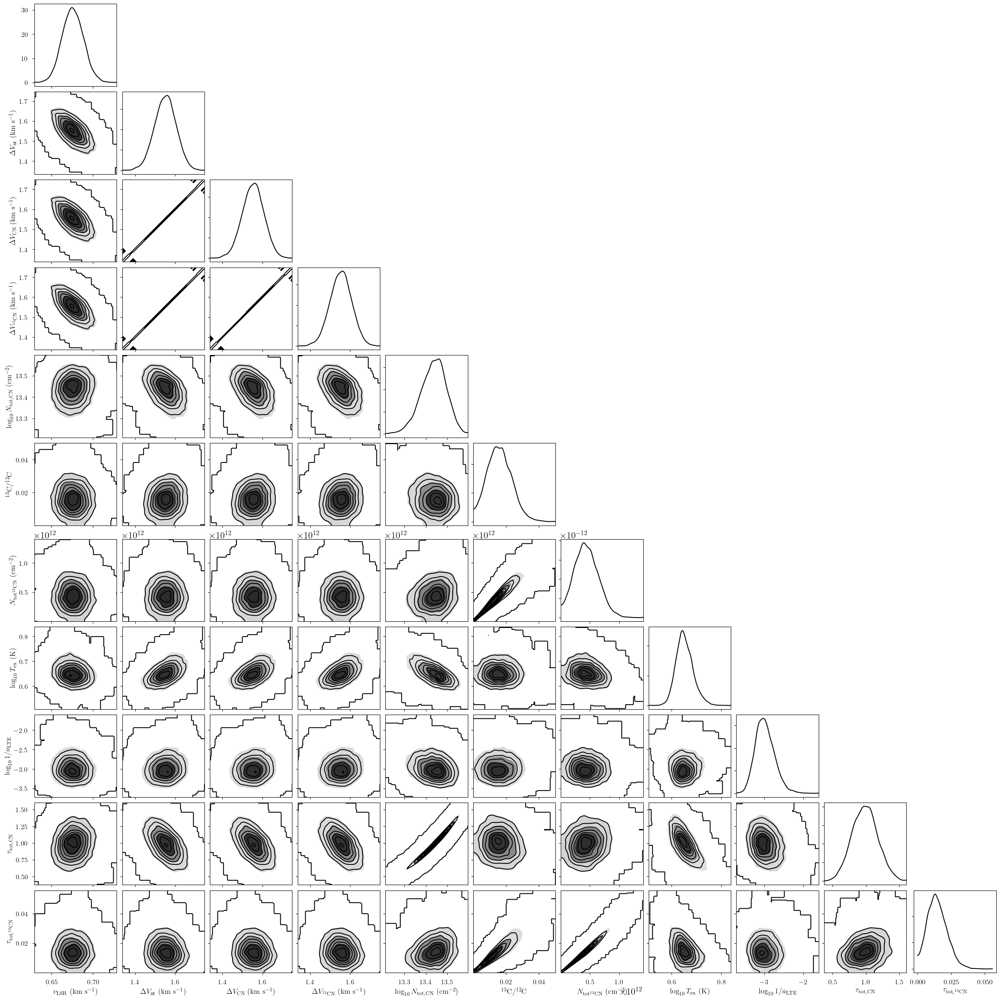

In [107]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=0), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)

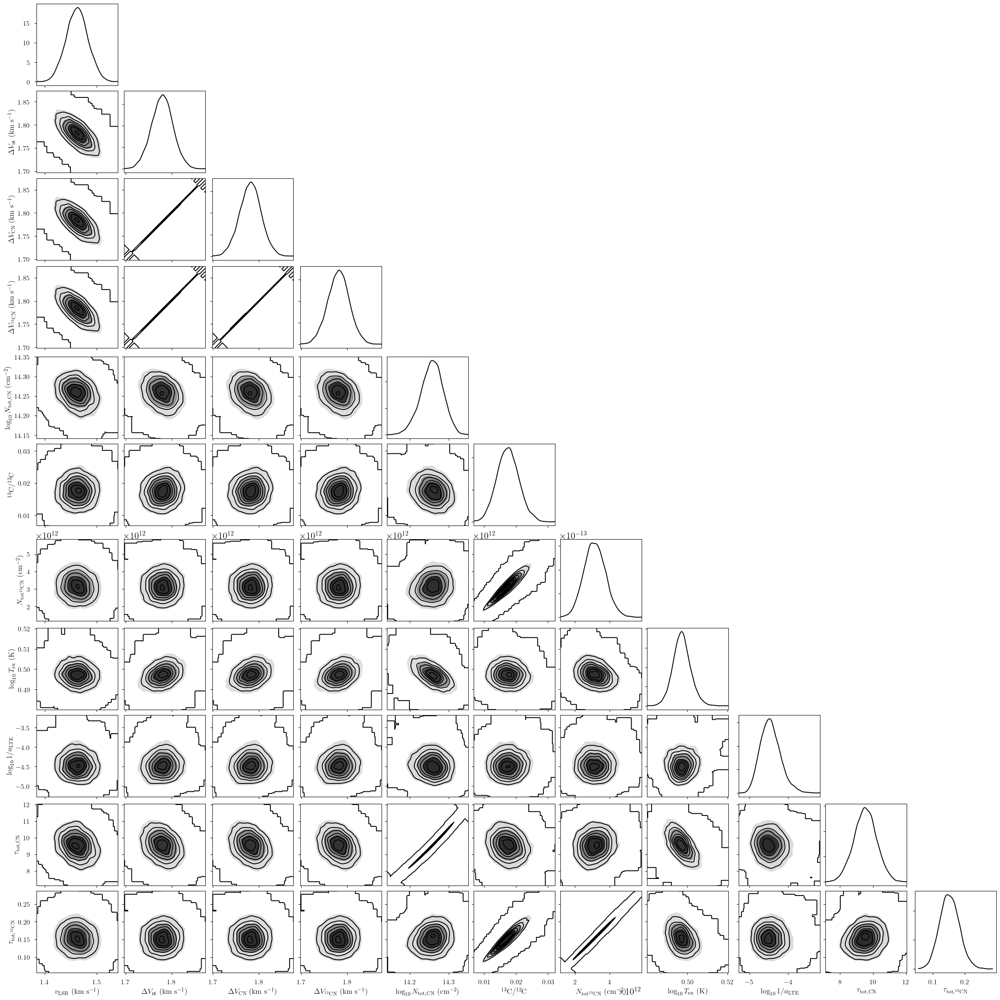

In [108]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=1), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)

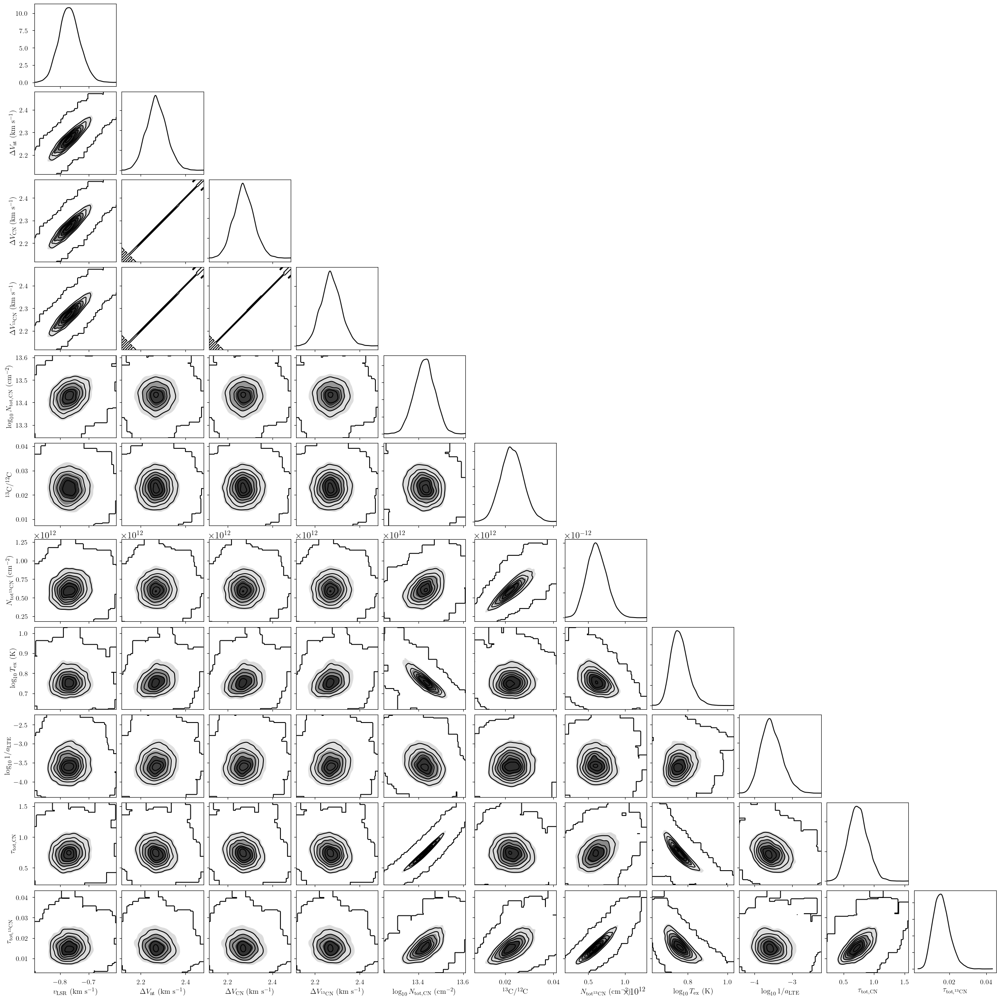

In [109]:
_ = plot_pair(
    model.trace.solution_0.sel(cloud=2), # samples
    var_names, # var_names to plot
    labeller=model.labeller, # label manager
    kind="kde",
)